In [1]:
from freecond_src.freecond_utils import get_pipeline_forward
from freecond_src.freecond import FC_config
from diffusers import DDIMScheduler
from PIL import Image
import torch

torch.cuda.set_device(0)
# pipeline, forward = get_pipeline_forward(method="sd",variant="sd15")

# pipeline, forward = get_pipeline_forward(method="cn")

# pipeline, forward = get_pipeline_forward(method="hdp",variant="sd15",device="cuda")

# pipeline, forward = get_pipeline_forward(method="pp",device="cuda")

# pipeline, forward = get_pipeline_forward(method="bn",device="cuda")

pipeline, forward = get_pipeline_forward(method="sd", variant="sdxl")

# pipeline.scheduler=DDIMScheduler.from_config(pipeline.scheduler.config) # This was used during the experiment


# pipeline, forward = get_pipeline_forward(method="flux", device="cuda")

/nfs/home/bluedyee/miniconda3/envs/fluxinp/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


❗❗❗ Be sure using correct python environment, the python environment are different for methods 
🔄 Building Stable-Diffusion-Inpainting FreeCond control...
# Load backbone model
## Load backbone model = diffusers/stable-diffusion-xl-1.0-inpainting-0.1 


Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  4.39it/s]


100%|██████████| 49/49 [00:03<00:00, 15.29it/s]


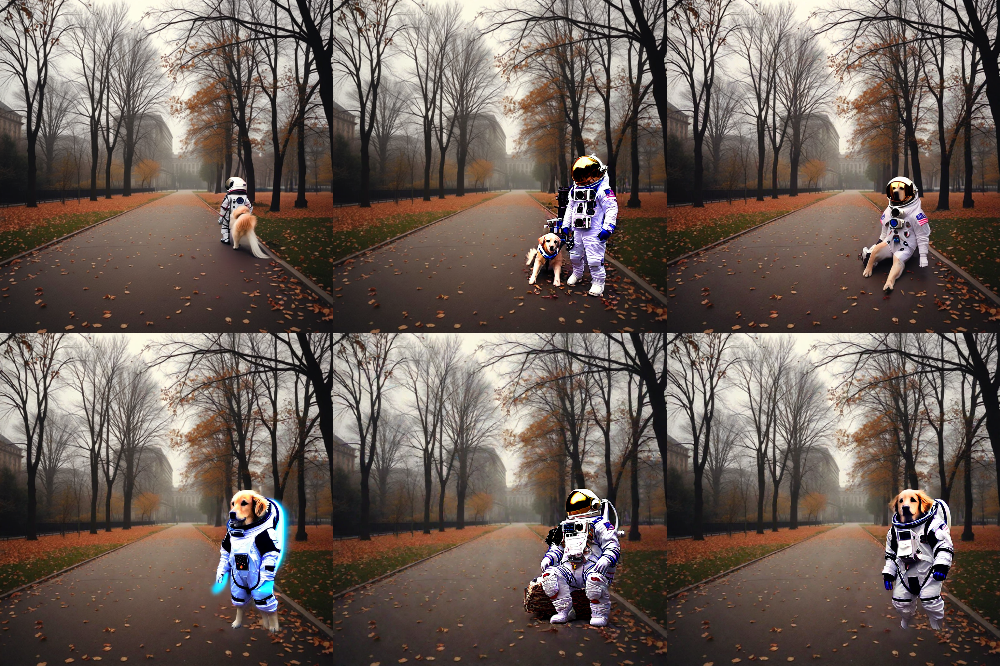

In [3]:
from diffusers.utils import make_image_grid
import torch

# ❗ The demonstration output aren't identical the reported images in our research paper.
# Because we delete some unnecessary operation during revision, leading to the change of effect about random seed.

mask = Image.open("./demo_data/mask_1_2.png").convert("L").resize((512, 512))
init_image = Image.open("./demo_data/img_1_2.jpg").convert("RGB").resize((512, 512))
prompt = "A golden retriever wearing astronaut gear, in cyberpunk style"
nprompt = "word, bad quality, bad anatomy, ugly, mutation, blurry, error"

# Default to SDI
fc_control = FC_config(
    change_step=0,
    fg_1=1,
    fg_2=1,
    bg_1=0,
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=32,
)
# Setting FreeCond control for SDI15
torch.manual_seed(777)
default_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)

fc_images = []

# FreeCond control for SDI 15, change alpha scale
fc_control = FC_config(
    change_step=0,
    fg_1=1,
    fg_2=3,
    bg_1=0,
    bg_2=0,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=32,
)
torch.manual_seed(777)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])

# FreeCond control for SDI 15, change beta scale
torch.manual_seed(777)
fc_control = FC_config(
    change_step=0,
    fg_1=1,
    fg_2=1,
    bg_1=0,
    bg_2=0.5,
    hq_1=1,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=4,
)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])

# Setting FreeCond control for SDI, change freq
torch.manual_seed(777)
fc_control = FC_config(
    change_step=25,
    fg_1=1,
    fg_2=1,
    bg_1=0,
    bg_2=0,
    hq_1=0,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=24,
)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])


# Setting FreeCond control for SDI, hybird
torch.manual_seed(777)
fc_control = FC_config(
    change_step=25,
    fg_1=3,
    fg_2=3,
    bg_1=0.3,
    bg_2=0.3,
    hq_1=0,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=24,
)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])

# Setting FreeCond control for SDI, hybrid with stage
torch.manual_seed(777)
fc_control = FC_config(
    change_step=25,
    fg_1=1,
    fg_2=1.5,
    bg_1=0.2,
    bg_2=0.2,
    hq_1=0,
    hq_2=1,
    lq_1=1,
    lq_2=1,
    fq_th=24,
)
fc_out = forward(
    fc_control,
    init_image=init_image,
    mask_image=mask,
    prompt=prompt,
    negative_prompt=nprompt,
)
fc_images.append(fc_out[0])

make_image_grid([default_out[0]] + fc_images, rows=2, cols=3)